# Puzzle Solver 🧩

In [1]:
import os
import glob
import numpy as np
from PIL import Image
import matplotlib.pyplot as plt
import re

# --- تنظیم مسیر دیتا (باید مسیر درست خودت رو بذاری) ---
folder_path = r"C:\Users\ALFA\Desktop\task2\Puzzle_2_40"

# --- خواندن فایل‌ها ---
output_file = os.path.join(folder_path, "Output.tif")
patch_files = glob.glob(os.path.join(folder_path, "Patch_*.tif"))

corners_img = np.array(Image.open(output_file))
patches_imgs = [np.array(Image.open(pf)) for pf in patch_files]


In [2]:

# --- کلاس Patch ---
class Patch:
    def __init__(self, id, image):
        self.id = id
        self.image = image
        self.edges = self.extract_edges()

    def extract_edges(self):
        return {
            'top': self.image[0, :, :],
            'bottom': self.image[-1, :, :],
            'left': self.image[:, 0, :],
            'right': self.image[:, -1, :]
        }

# --- ساخت Patch ها ---
patches = []
for i, patch_img in enumerate(patches_imgs):
    patches.append(Patch(i, patch_img))

# استخراج ابعاد هر پچ
patch_h, patch_w, _ = patches_imgs[0].shape

# --- استخراج تعداد ردیف و ستون ---
folder_name = os.path.basename(folder_path)
match = re.search(r'_(\d+)$', folder_name)
if not match:
    raise ValueError("Cannot extract number of pieces from folder name.")
n_pitches = int(match.group(1))

img_h, img_w = corners_img.shape[:2]
rows = img_h // patch_h
cols = img_w // patch_w

puzzle_grid = [[None for _ in range(cols)] for _ in range(rows)]

# --- استخراج 4 گوشه از تصویر اصلی ---
top_left_patch     = corners_img[0:patch_h, 0:patch_w]
top_right_patch    = corners_img[0:patch_h, -patch_w:]
bottom_left_patch  = corners_img[-patch_h:, 0:patch_w]
bottom_right_patch = corners_img[-patch_h:, -patch_w:]

corner_patches = [
    Patch(-1, top_left_patch),
    Patch(-2, top_right_patch),
    Patch(-3, bottom_left_patch),
    Patch(-4, bottom_right_patch)
]

patches.extend(corner_patches)

# --- ماتریس پازل خالی ---
puzzle_grid = [[None for _ in range(cols)] for _ in range(rows)]

# جایگذاری گوشه‌ها در پازل
puzzle_grid[0][0] = corner_patches[0]
puzzle_grid[0][cols-1] = corner_patches[1]
puzzle_grid[rows-1][0] = corner_patches[2]
puzzle_grid[rows-1][cols-1] = corner_patches[3]

used_ids = {-1, -2, -3, -4}

# --- تابع محاسبه واریانس اختلاف لبه‌ها ---
def edge_variance(edge1, edge2):
    diff = edge1.astype(np.int32) - edge2.astype(np.int32)
    return np.var(diff)

# --- جهت مقابل هر لبه (برای مقایسه) ---
opposite_edge = {
    'top': 'bottom',
    'bottom': 'top',
    'left': 'right',
    'right': 'left'
}


In [3]:
# --- تابع برای پیدا کردن همه لبه‌های آزاد ---
def get_all_edges(puzzle_grid):
    edges_list = []
    for r in range(rows):
        for c in range(cols):
            patch = puzzle_grid[r][c]
            if patch is None:
                continue

            if r == 0 or puzzle_grid[r-1][c] is None:
                edges_list.append(((r, c), 'top', patch.edges['top']))

            if r == rows-1 or puzzle_grid[r+1][c] is None:
                edges_list.append(((r, c), 'bottom', patch.edges['bottom']))

            if c == 0 or puzzle_grid[r][c-1] is None:
                edges_list.append(((r, c), 'left', patch.edges['left']))

            if c == cols-1 or puzzle_grid[r][c+1] is None:
                edges_list.append(((r, c), 'right', patch.edges['right']))

    return edges_list

# --- تابع پیدا کردن بهترین پچ برای یک لبه ---
def find_best_match_for_edge(free_edge_img, side, used_ids, patches):
    comp_side = opposite_edge[side]

    min_var = float('inf')
    best_patch = None

    for patch in patches:
        if patch.id in used_ids:
            continue

        candidate_edge = patch.edges[comp_side]
        var = edge_variance(free_edge_img, candidate_edge)
        if var < min_var:
            min_var = var
            best_patch = patch

    return best_patch, min_var


In [4]:

# --- تابع حل پازل بر اساس کمترین واریانس ---
def puzzle_solver(patches, puzzle_grid, rows, cols):
    used_ids = {-1, -2, -3, -4}
    total_pieces = rows * cols

    plt.ion()  # حالت تعاملی برای نمایش مرحله به مرحله

    while len(used_ids) < total_pieces:
        free_edges = get_all_edges(puzzle_grid)

        best_patch = None
        best_var = float('inf')
        best_pos = None
        best_side = None

        for (r, c), side, free_edge_img in free_edges:
            candidate_patch, candidate_var = find_best_match_for_edge(free_edge_img, side, used_ids, patches)
            if candidate_patch is not None and candidate_var < best_var:
                best_var = candidate_var
                best_patch = candidate_patch
                best_pos = (r, c)
                best_side = side

        if best_patch is None:
            print("No suitable patch found, puzzle may be complete or stuck.")
            break

        r, c = best_pos
        if best_side == 'top':
            new_pos = (r-1, c)
        elif best_side == 'bottom':
            new_pos = (r+1, c)
        elif best_side == 'left':
            new_pos = (r, c-1)
        elif best_side == 'right':
            new_pos = (r, c+1)
        else:
            raise ValueError("Unknown side!")

        nr, nc = new_pos

        if nr < 0 or nr >= rows or nc < 0 or nc >= cols:
            used_ids.add(best_patch.id)
            continue

        if puzzle_grid[nr][nc] is not None:
            used_ids.add(best_patch.id)
            continue

        puzzle_grid[nr][nc] = best_patch
        used_ids.add(best_patch.id)

        show_puzzle_step(puzzle_grid)

        print(f"Placed patch {best_patch.id} at position {(nr, nc)} matched to {best_side} edge of patch at {(r,c)} with variance {best_var:.2f}")

    plt.ioff()  # خاموش کردن حالت تعاملی
    plt.show()

    return puzzle_grid



In [5]:

# --- ساخت تصویر نهایی ---
def assemble_final_image(puzzle_grid):
    rows = len(puzzle_grid)
    cols = len(puzzle_grid[0])
    patch_h, patch_w, channels = puzzle_grid[0][0].image.shape

    final_img = np.zeros((rows * patch_h, cols * patch_w, channels), dtype=np.uint8)

    for r in range(rows):
        for c in range(cols):
            patch = puzzle_grid[r][c]
            if patch is not None:
                final_img[r*patch_h:(r+1)*patch_h, c*patch_w:(c+1)*patch_w, :] = patch.image
            else:
                final_img[r*patch_h:(r+1)*patch_h, c*patch_w:(c+1)*patch_w, :] = 0

    return final_img

# --- نمایش مرحله به مرحله پازل ---
def show_puzzle_step(puzzle_grid):
    final_img = assemble_final_image(puzzle_grid)
    plt.imshow(final_img)
    plt.axis('off')
    plt.title("Puzzle Assembly Step")
    plt.pause(0.5)
    plt.clf()


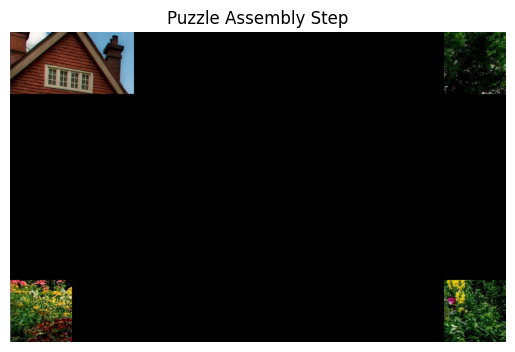

Placed patch 4 at position (0, 1) matched to right edge of patch at (0, 0) with variance 63.13


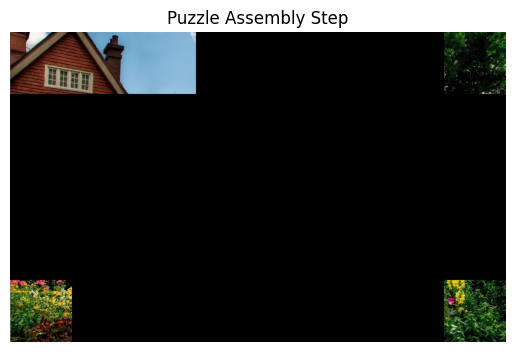

Placed patch 7 at position (0, 2) matched to right edge of patch at (0, 1) with variance 2.27


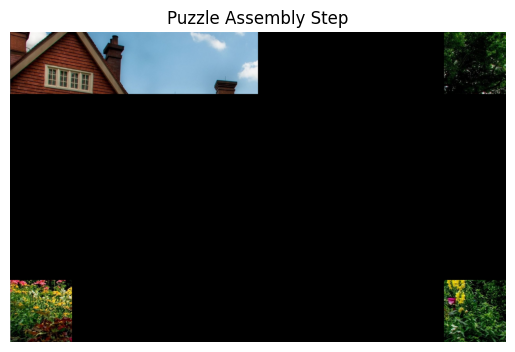

Placed patch 12 at position (0, 3) matched to right edge of patch at (0, 2) with variance 2.62


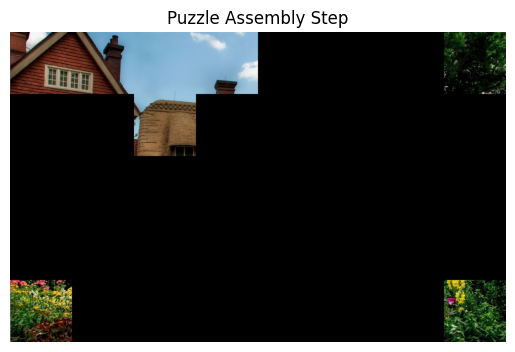

Placed patch 27 at position (1, 2) matched to bottom edge of patch at (0, 2) with variance 2.77


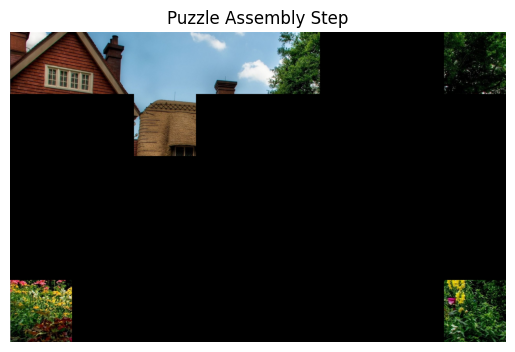

Placed patch 17 at position (0, 4) matched to right edge of patch at (0, 3) with variance 3.39


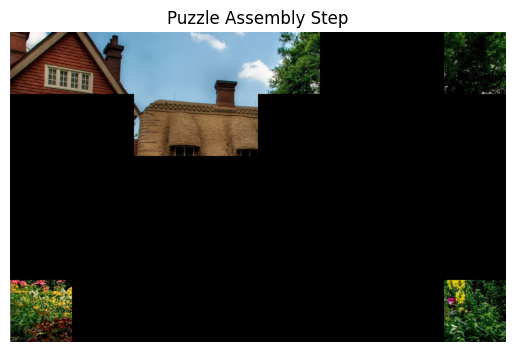

Placed patch 35 at position (1, 3) matched to bottom edge of patch at (0, 3) with variance 41.13


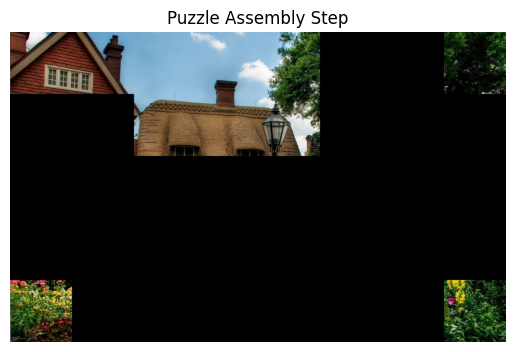

Placed patch 14 at position (1, 4) matched to right edge of patch at (1, 3) with variance 186.11


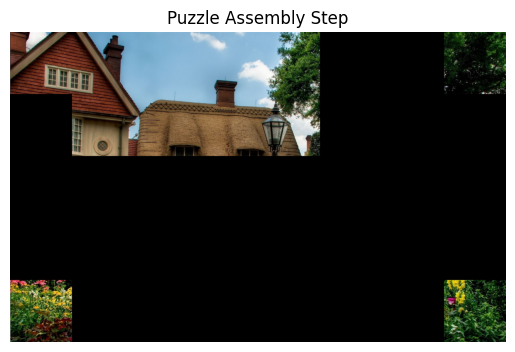

Placed patch 5 at position (1, 1) matched to bottom edge of patch at (0, 1) with variance 193.30


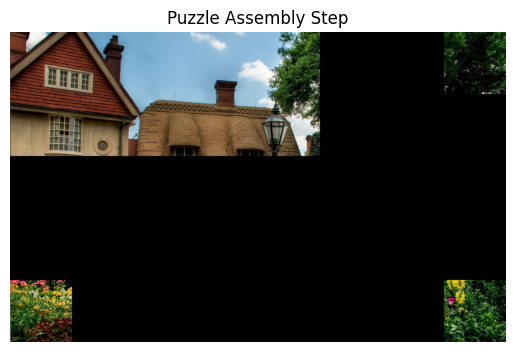

Placed patch 29 at position (1, 0) matched to left edge of patch at (1, 1) with variance 29.64


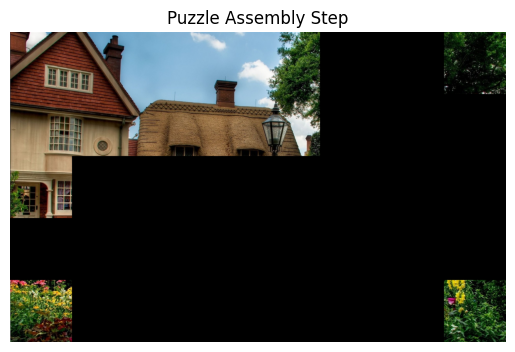

Placed patch 26 at position (2, 0) matched to bottom edge of patch at (1, 0) with variance 67.75


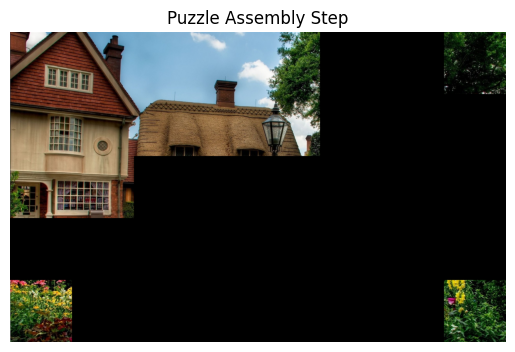

Placed patch 15 at position (2, 1) matched to right edge of patch at (2, 0) with variance 53.72


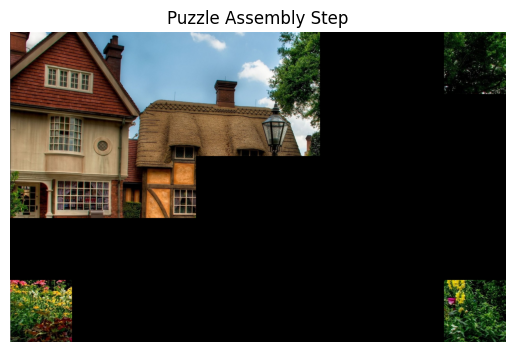

Placed patch 8 at position (2, 2) matched to right edge of patch at (2, 1) with variance 76.13


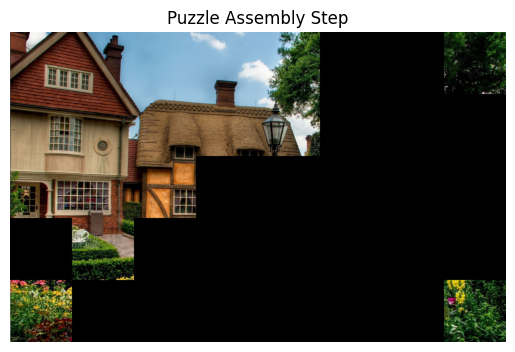

Placed patch 11 at position (3, 1) matched to bottom edge of patch at (2, 1) with variance 135.96


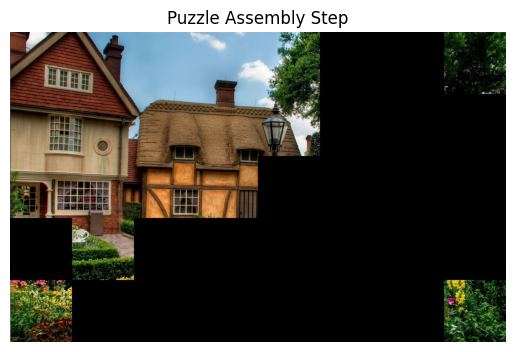

Placed patch 21 at position (2, 3) matched to right edge of patch at (2, 2) with variance 192.57


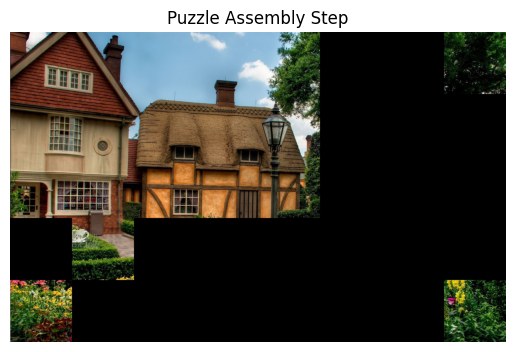

Placed patch 28 at position (2, 4) matched to right edge of patch at (2, 3) with variance 141.50


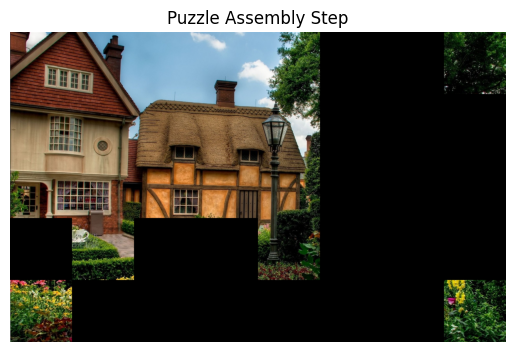

Placed patch 10 at position (3, 4) matched to bottom edge of patch at (2, 4) with variance 193.19


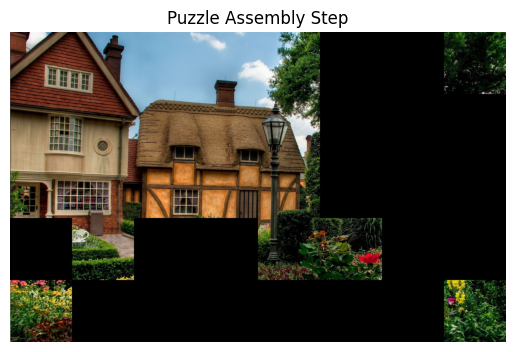

Placed patch 24 at position (3, 5) matched to right edge of patch at (3, 4) with variance 205.81


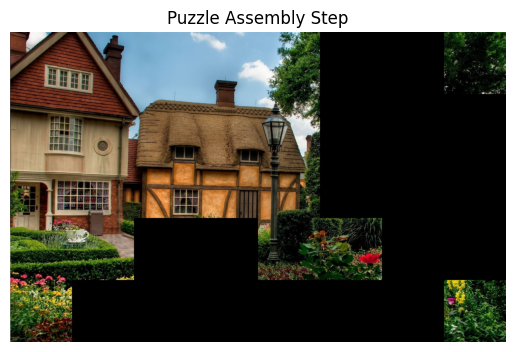

Placed patch 19 at position (3, 0) matched to bottom edge of patch at (2, 0) with variance 217.01


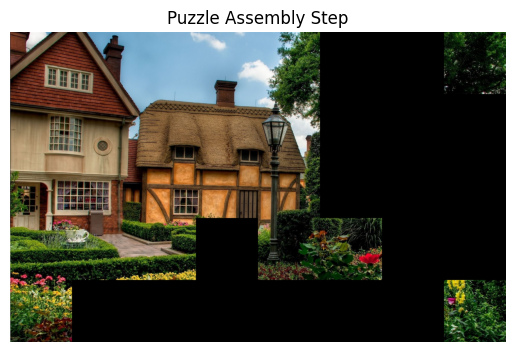

Placed patch 1 at position (3, 2) matched to right edge of patch at (3, 1) with variance 223.17


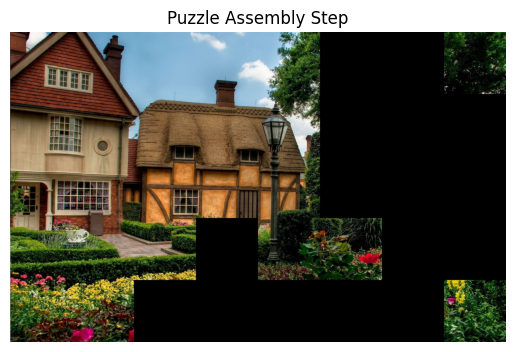

Placed patch 34 at position (4, 1) matched to right edge of patch at (4, 0) with variance 413.72


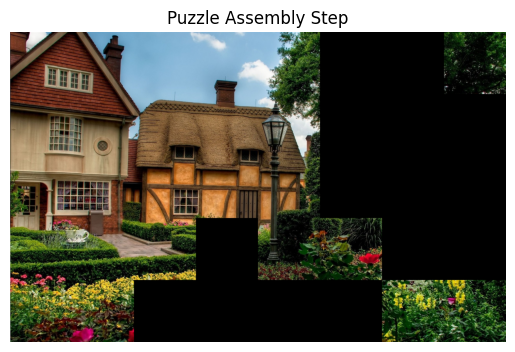

Placed patch 3 at position (4, 6) matched to left edge of patch at (4, 7) with variance 457.07


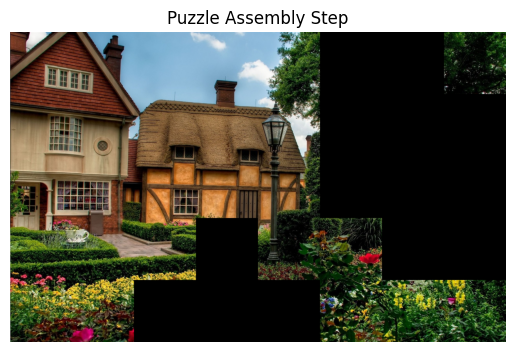

Placed patch 33 at position (4, 5) matched to left edge of patch at (4, 6) with variance 396.13


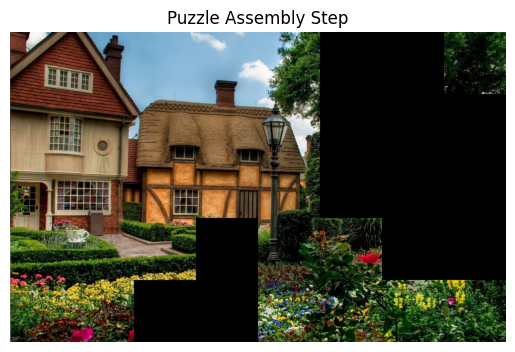

Placed patch 23 at position (4, 4) matched to left edge of patch at (4, 5) with variance 452.90


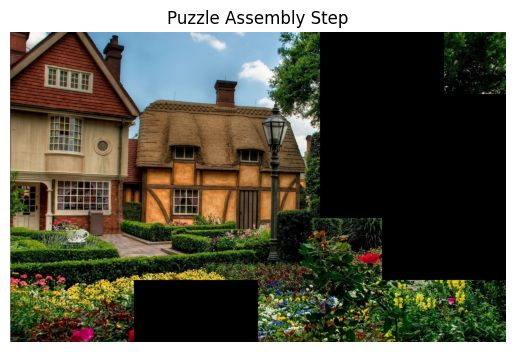

Placed patch 25 at position (3, 3) matched to bottom edge of patch at (2, 3) with variance 481.43


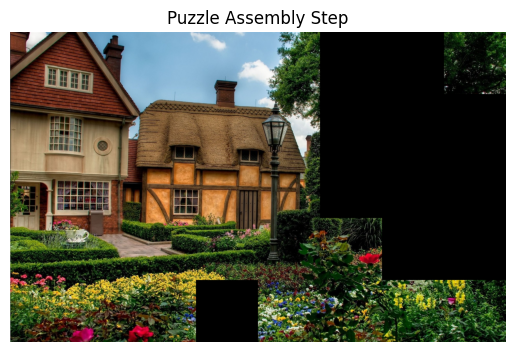

Placed patch 0 at position (4, 2) matched to right edge of patch at (4, 1) with variance 494.60


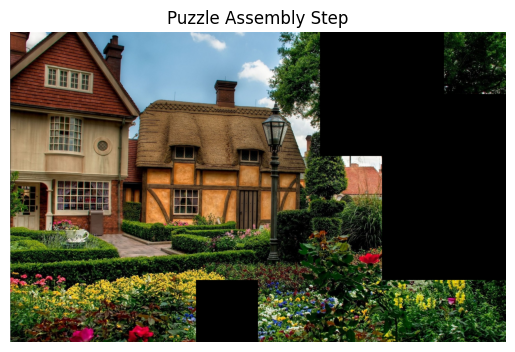

Placed patch 32 at position (2, 5) matched to right edge of patch at (2, 4) with variance 538.40


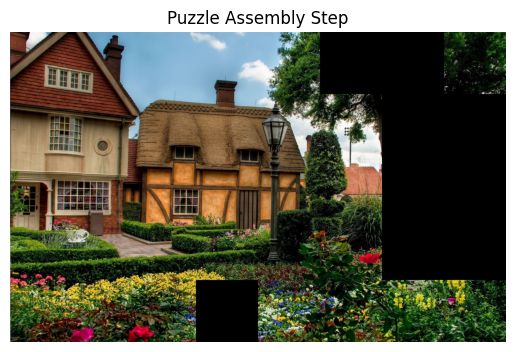

Placed patch 2 at position (1, 5) matched to top edge of patch at (2, 5) with variance 499.00


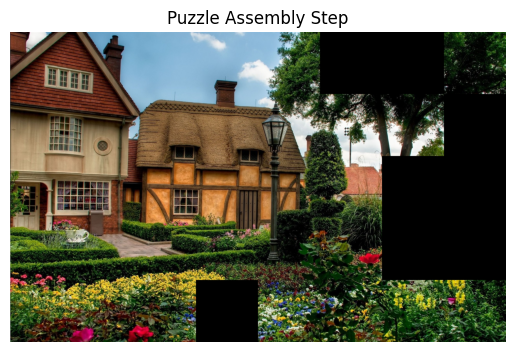

Placed patch 22 at position (1, 6) matched to right edge of patch at (1, 5) with variance 173.60


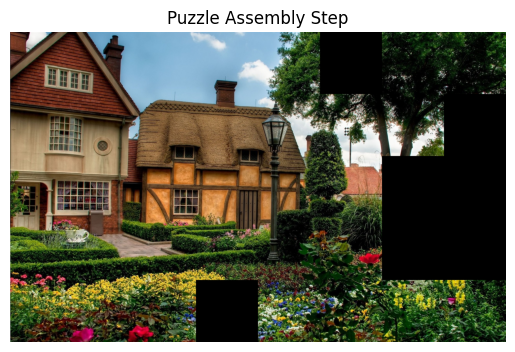

Placed patch 31 at position (0, 6) matched to top edge of patch at (1, 6) with variance 404.76


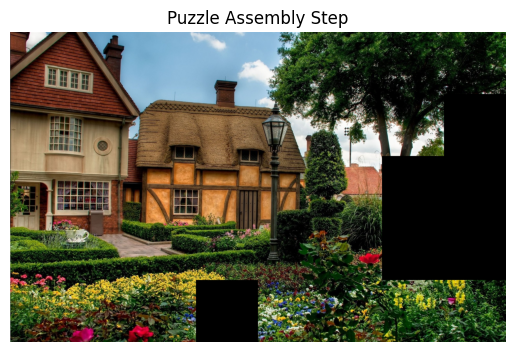

Placed patch 20 at position (0, 5) matched to left edge of patch at (0, 6) with variance 437.50


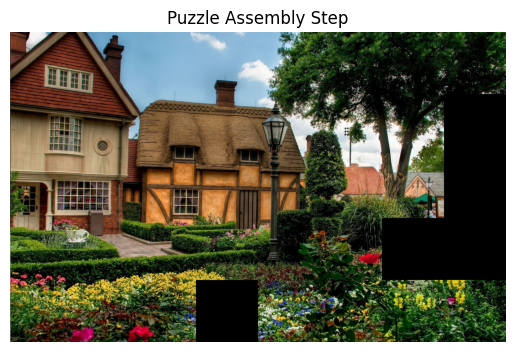

Placed patch 16 at position (2, 6) matched to bottom edge of patch at (1, 6) with variance 500.20


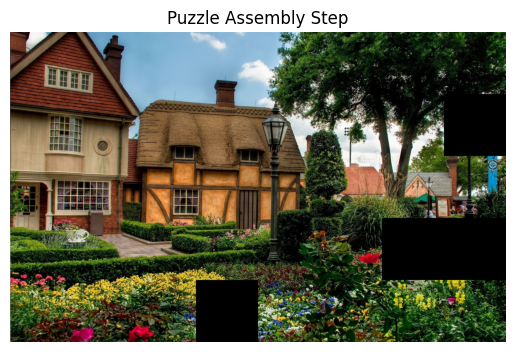

Placed patch 30 at position (2, 7) matched to right edge of patch at (2, 6) with variance 240.68


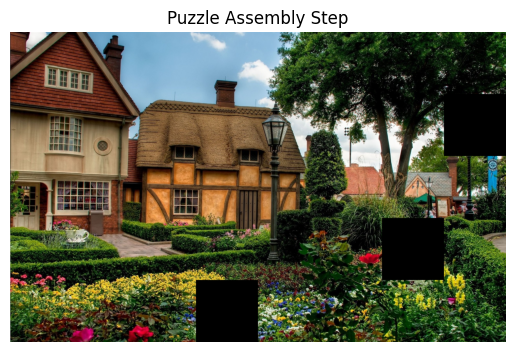

Placed patch 6 at position (3, 7) matched to bottom edge of patch at (2, 7) with variance 402.36


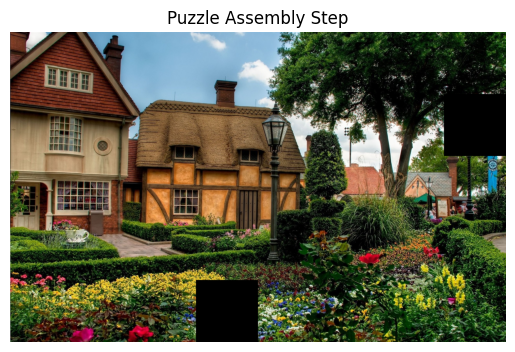

Placed patch 9 at position (3, 6) matched to left edge of patch at (3, 7) with variance 507.81


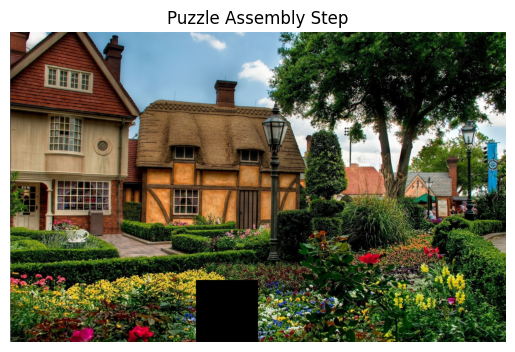

Placed patch 13 at position (1, 7) matched to top edge of patch at (2, 7) with variance 535.31


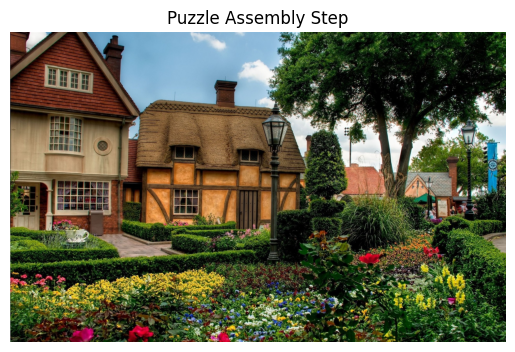

Placed patch 18 at position (4, 3) matched to right edge of patch at (4, 2) with variance 1308.80


<Figure size 640x480 with 0 Axes>

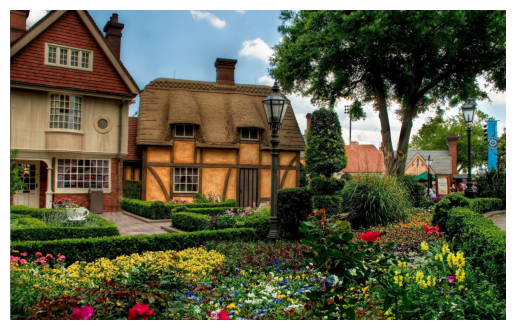

Puzzle solved and final image saved.


In [6]:

# --- اجرای حل پازل ---
puzzle_grid = puzzle_solver(patches, puzzle_grid, rows, cols)


# --- ساخت تصویر نهایی ---
final_img = assemble_final_image(puzzle_grid)

# --- نمایش و ذخیره نتیجه ---
plt.imshow(final_img)
plt.axis('off')
plt.show()

Image.fromarray(final_img).save(os.path.join(folder_path, "final_variance_based.tif"))

print("Puzzle solved and final image saved.")


